# Classifying Dog Breeds Using Transfer Learning and TensorFlow

The problem of this project is multi-class image classification.

I will use a pretrained deep learning model from TensorFlow Hub to create this model.

The dataset is taken from [Kaggle](https://www.kaggle.com/c/dog-breed-identification/overview)

*This project started during cmopleeting ZTM course "Complete Machine Learning & Data Science Bootcamp 2023" [link to the notebook on Github](https://github.com/mrdbourke/zero-to-mastery-ml/blob/master/section-4-unstructured-data-projects/end-to-end-dog-vision.ipynb)*


## Setting the WorkSpace

In [61]:
import tensorflow as tf
import tensorflow_hub as hub

print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)

TF version: 2.12.0
Hub version: 0.14.0


In [62]:
#check available devices
from tensorflow.python.client import device_lib

def get_available_devices():
    local_device_protos = device_lib.list_local_devices()
    return [x.name for x in local_device_protos]

print(get_available_devices())

['/device:CPU:0', '/device:GPU:0']


In [63]:
# Providing my drive to this notebook
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Accessing the data

labels.csv contains all of the image ID's and their assosciated dog breed (data and labels).

In [64]:
folder_path = '/content/drive/MyDrive/Projects/dog-breeder/dog-breed-identification/'

In [65]:
import pandas as pd
labels_csv = pd.read_csv(folder_path + "labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [66]:
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

Text(0.5, 1.0, 'All the dog breeds')

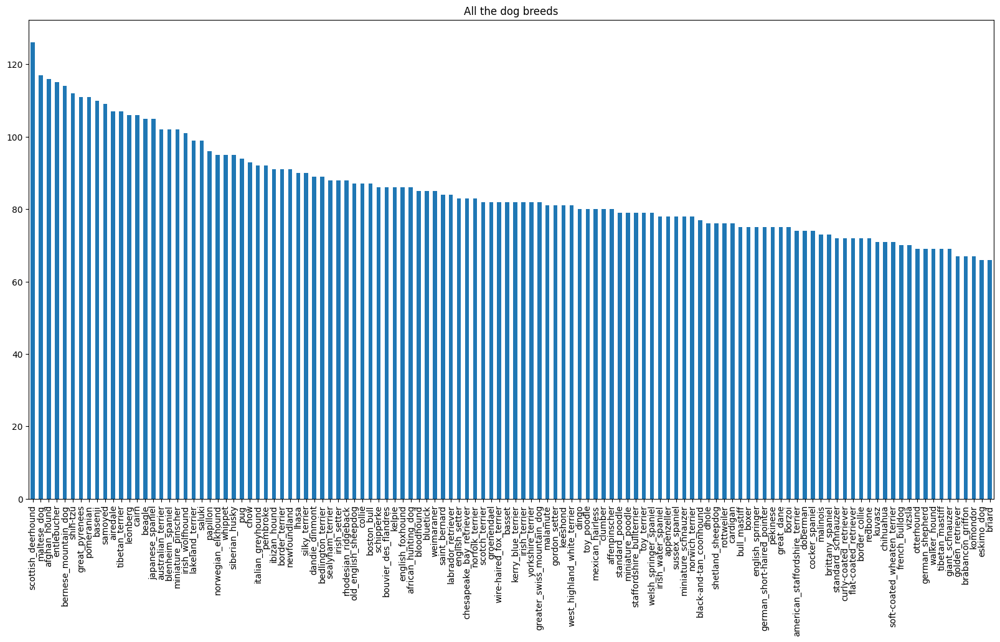

In [67]:
import matplotlib.pyplot as plt
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));
plt.title('All the dog breeds')

Checking one of the images:

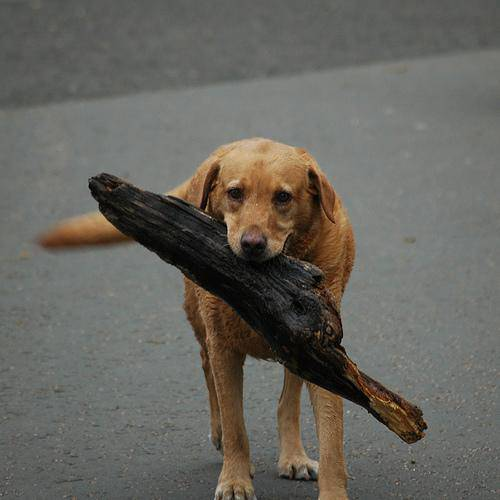

In [68]:
from IPython.display import display, Image
Image(folder_path + "/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")

## Preprocessing the data, preparing images and labels

Using labels_csv I'll create:

* A list a filepaths to training images
* An array of all labels
* An array of all unique labels

In [69]:
# Creating pathnames from image ID's
filenames = [folder_path + "train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Checking the first 3 filenames
filenames[:3]

['/content/drive/MyDrive/Projects/dog-breeder/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Projects/dog-breeder/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Projects/dog-breeder/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg']

I will check if the number of filenames matcheses the number of actual image files

In [70]:
import os

if len(os.listdir(folder_path + "train")) == len(filenames):
  print("Filenames = actual amount of files!")
else:
  print("Filenames =! actual amount of files, check the target directory.")

Filenames =! actual amount of files, check the target directory.


Seems that I should directory for duplicates that may occurre because of uploading a large dataset to drive. If there are any, I will print them and delete them from the list of files.

In [71]:
train_files = os.listdir(folder_path + "train")
print(f'Before deleting duplicates: {len(train_files)}')
for i in train_files:
  if folder_path +'train/' + i not in filenames:
    print(i)
    train_files.remove(i)

print(f'After deleting duplicates: {len(train_files)}')

Before deleting duplicates: 10231
d95e7320281728b297f6ef83284dfddc (1).jpg
6fb144599ec91a40edeac0d884ff43b2 (1).jpg
699dac12962e0dccc5109ca8203e5feb (1).jpg
3ea505ad860189c14dbb73b9120a2ca5 (1).jpg
4a626b631ade1993520b0fbb8cd9554b (1).jpg
1c32819dd77f0ae25c700670d4d054dc (1).jpg
2dfc5a83323990d5e42e2912dc1a884a (1).jpg
08e99ed86b0ce429fef52a8ca33e1551 (1).jpg
0a783538d5f3aaf017b435ddf14cc5c2 (1).jpg
After deleting duplicates: 10222


So now I will try again to check whether the amounts are queal

In [72]:
if len(train_files) == len(filenames):
  print("Filenames = actual amount of files!")
else:
  print("Filenames =! actual amount of files, check the target directory.")

Filenames = actual amount of files!


Visualizing directly from a filepath.

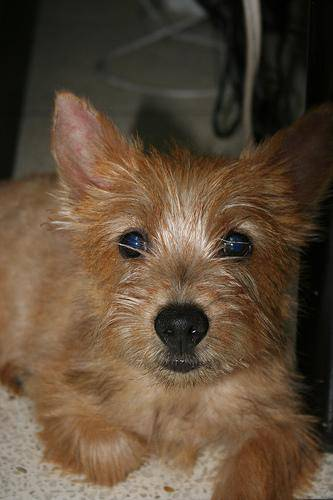

In [73]:
Image(filenames[2312])

Getting the labels from labels_csv

In [74]:
import numpy as np
labels = labels_csv["breed"].to_numpy() # convert labels column to NumPy array
len(labels), labels[:10]

(10222,
 array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
        'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
        'scottish_deerhound'], dtype=object))

Checking if the amount of labels matches the amount of filenames

In [75]:
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories.")

Number of labels matches number of filenames!


Defining unique breeds

In [76]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

Turning labels into an array of booleans

In [77]:
boolean_labels = [label == np.array(unique_breeds) for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Creating a subset and training, validation sets

In [78]:
X = filenames
y = boolean_labels

In the dataset there are more than 10.000 images, so for efficiency purposes, I will use a smaller subset of images

In [79]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:500}
NUM_IMAGES

1000

Splitting data into training and validation sets

In [80]:
# Import train_test_split from Scikit-Learn
from sklearn.model_selection import train_test_split

# Split them into training and validation using NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [81]:
# Checking out the training data (image file paths and labels)
X_train[:5], y_train[:2]

(['/content/drive/MyDrive/Projects/dog-breeder/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Projects/dog-breeder/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Projects/dog-breeder/dog-breed-identification/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Projects/dog-breeder/dog-breed-identification/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Projects/dog-breeder/dog-breed-identification/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fal

### Preprocessing images. Turning into tensors

For this I will create a function which: Takes an image filename as input. Uses TensorFlow to read the file and save it to a variable, image.
Turn the image (a jpeg file) into Tensors. Resize the image to be of shape (224, 224). Return the modified image.

In [82]:
image = plt.imread(filenames[1])
image.shape # height, width, colour channel value

(375, 500, 3)

In [83]:
tf.constant(image)[:2] # converts to a Tensor

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[ 51,  34,  26],
        [ 55,  38,  30],
        [ 61,  43,  33],
        ...,
        [127,  92,  62],
        [ 77,  42,  12],
        [167, 132, 102]],

       [[ 63,  44,  37],
        [ 64,  46,  36],
        [ 63,  45,  35],
        ...,
        [113,  82,  54],
        [ 44,  13,   0],
        [ 71,  40,  12]]], dtype=uint8)>

In [84]:
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image, turns it into Tensors, resize it to be of shape (224, 224).
  Returns the modified image.
  """
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3) # turning into tensor
  image = tf.image.convert_image_dtype(image, tf.float32) # converting the colour channel values from 0-225 values to 0-1 values
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE]) # resizing

  return image



### Creating data batches

Building a function that creates tuples (image, label)

In [85]:
def get_image_label(image_path, label):
  """
  Input: file path name and associated label,
  returns a tuple of (image, label)
  """
  image = process_image(image_path)
  return image, label

Building a function that creates mini-batches. The function have to be able to process each set: training one, validation one, and test one.

In [139]:
BATCH_SIZE = 32

def create_data_batches(x, y=None, batch_size=BATCH_SIZE,
                        val_data=False, test_data=False):
  """
  Creates data batches. Input: image (x) and label (y) pairs.
  Shuffles the data for the training set but not for the validation set.
  Can process test data without labels.
  """
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  elif val_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    data = data.shuffle(buffer_size=len(x))
    data_batch = data.map(get_image_label).batch(batch_size)

  return data_batch


Creating training and validation data batches

In [87]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, val_data=True)

Creating training data batches
Creating validation data batches...


In [88]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing data batches

To visualize the batches I will create a function that displays some images from a data batch

In [89]:
def show_images(n, images, labels):
  """
  Displays n images from a data batch
  """
  plt.figure(figsize=(10,10))
  for i in range(n):
    ax = plt.subplot(int(n/4), 4, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis('off')


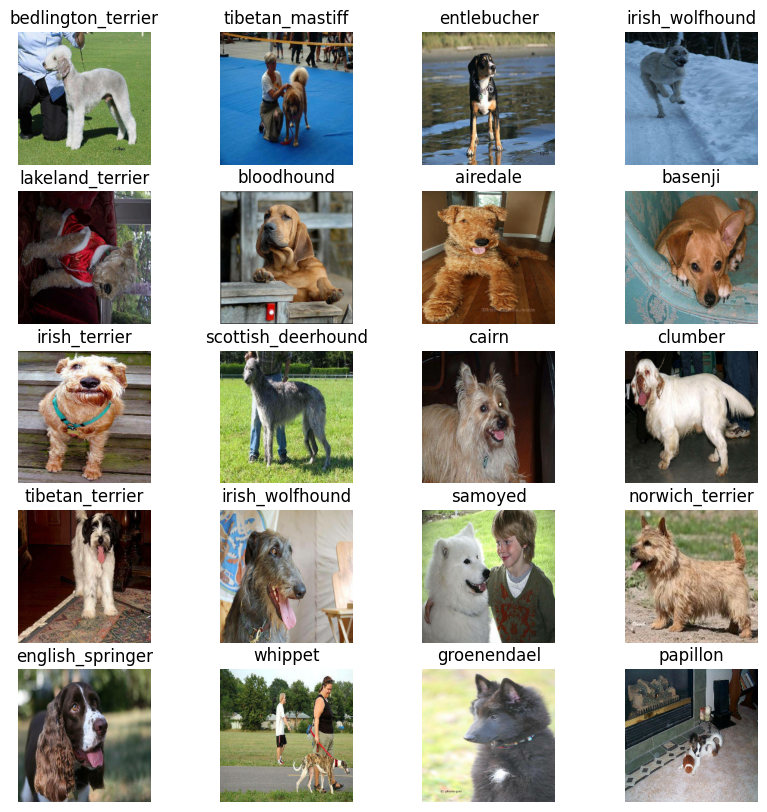

In [90]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_images(20, train_images, train_labels)

## Creating and training a model

For this project I will use existing model from TensorFlow Hub. The problem is image classification, so I will use [mobilenet_v2_130_224](https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4)  which takes an input of images in the shape 224, 224 and it has been trained in the domain of image classification

### Building a model

In [91]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

OUTPUT_SHAPE = len(unique_breeds)

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

For building a model I will use Keras API

I will create a function which: Takes the input shape, output shape and the model we've chosen's URL as parameters.
Defines the layers in a Keras model in a sequential fashion (do this first, then this, then that).
Compiles the model (says how it should be evaluated and improved).
Builds the model (tells it what kind of input shape it'll be getting).
Returns the model.

In [92]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", model_url)

  model = tf.keras.Sequential([
    hub.KerasLayer(model_url), #input
    tf.keras.layers.Dense(units=output_shape,
                          activation='softmax')]) # output
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  model.build(input_shape)

  return model

In [93]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_2 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_2 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


### Creating callbacks

In [94]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Now I will create a function that creates TensorBoard Callback.

In [95]:
import datetime

def create_tensorboard_callback():
  logdir = os.path.join("/content/drive/MyDrive/Projects/dog-breeder/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

I will also create an early stopping CallBack which will stop training the model if it stops imporving for 3 epochs

In [96]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

### Training a model on a subset

Checking whether the GPU is available before training the model

In [97]:
print("GPU", "is available" if tf.config.list_physical_devices("GPU") else "is not available")

GPU is available


In [98]:
NUM_EPOCHS = 30 #@param {type:"slider", min:10, max:100, step:10}

Building a function to train the model.

In [99]:
def train_model():
  model = create_model()

  tensorboard = create_tensorboard_callback()

  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  return model

Fitting the model

In [107]:
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/30
25/25 [==============================] - 8s 136ms/step - loss: 4.4952 - accuracy: 0.1138 - val_loss: 3.4008 - val_accuracy: 0.2450
Epoch 2/30
25/25 [==============================] - 3s 121ms/step - loss: 1.5904 - accuracy: 0.7025 - val_loss: 2.1960 - val_accuracy: 0.5300
Epoch 3/30
25/25 [==============================] - 4s 169ms/step - loss: 0.5749 - accuracy: 0.9275 - val_loss: 1.6968 - val_accuracy: 0.6150
Epoch 4/30
25/25 [==============================] - 4s 150ms/step - loss: 0.2512 - accuracy: 0.9912 - val_loss: 1.5267 - val_accuracy: 0.6450
Epoch 5/30
25/25 [==============================] - 3s 119ms/step - loss: 0.1472 - accuracy: 0.9962 - val_loss: 1.4506 - val_accuracy: 0.6450
Epoch 6/30
25/25 [==============================] - 3s 128ms/step - loss: 0.1004 - accuracy: 1.0000 - val_loss: 1.4094 - val_accuracy: 0.6500
Epoch 7/30
25/25 [==============================] - 3s

### Checking the TensorBoard logs

In [108]:
%tensorboard --logdir /content/drive/MyDrive/Projects/dog-breeder/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained (on subset) model

In [109]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 91ms/step


array([[1.57039764e-03, 1.64332610e-04, 2.68785225e-04, ...,
        1.81452080e-04, 2.76894007e-05, 3.91409639e-03],
       [1.92836684e-03, 1.82604487e-03, 1.50838038e-02, ...,
        1.05378870e-03, 4.92989598e-03, 4.74674162e-04],
       [3.12850170e-06, 1.16563533e-05, 1.43692205e-05, ...,
        1.82174394e-04, 6.77403023e-06, 2.19875801e-05],
       ...,
       [3.33857042e-06, 1.22285674e-05, 3.72177419e-06, ...,
        7.55312476e-06, 9.26160574e-05, 5.27577067e-05],
       [6.08854089e-03, 1.20590594e-04, 3.27171379e-04, ...,
        5.00166243e-05, 7.50915860e-05, 7.10776262e-03],
       [4.04983672e-04, 4.60806390e-04, 7.23530829e-04, ...,
        1.15042238e-03, 8.33181606e-04, 3.53343494e-05]], dtype=float32)

In [110]:
predictions.shape

(200, 120)

Now I will create the function that convert prediction probabilities into predicted labels.

In [111]:
def get_pred_label(prediction_probabilities):
  """
  Turns prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(predictions[0])
pred_label

'border_terrier'

Now I will create a function that unbatches the validation data

In [112]:
def unbatcher(data):
  """
  Takes a batches dataset of (image, label) Tensors
  and returns separate arrays of images and labels
  """
  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

val_images, val_labels = unbatcher(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now I will create functions to make the results visible.

First function: Takes an array of probabilities, truth labels, images, an integer. Converts the prediction probabilities to a predicted label. Plot the predicted label, its predicted probability, the truth label and target image on a single plot.

In [113]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green" # right prediction
  else:
    color = "red" # wrong prediction

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

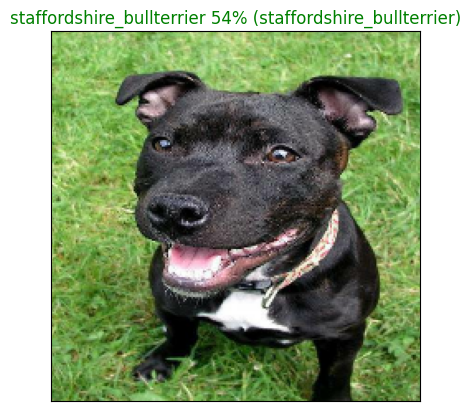

In [114]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=50)

Now I will create a function that plots top 10 highest prediction confidences and the truth label for sample n

In [115]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 probabilities with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  pred_label = get_pred_label(pred_prob)

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

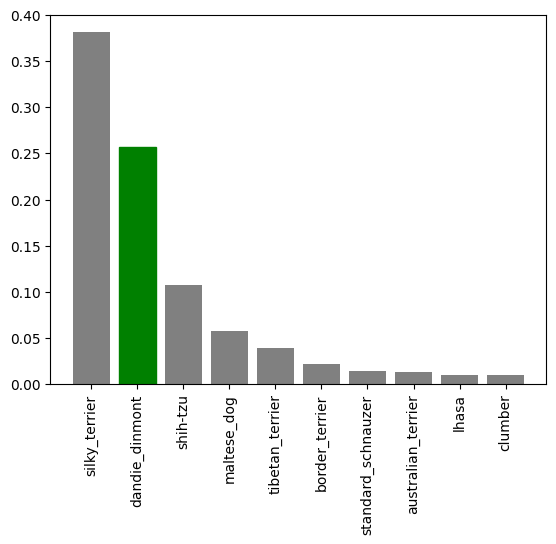

In [116]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=30)

So now I will visualize some predictions and evaluate the model

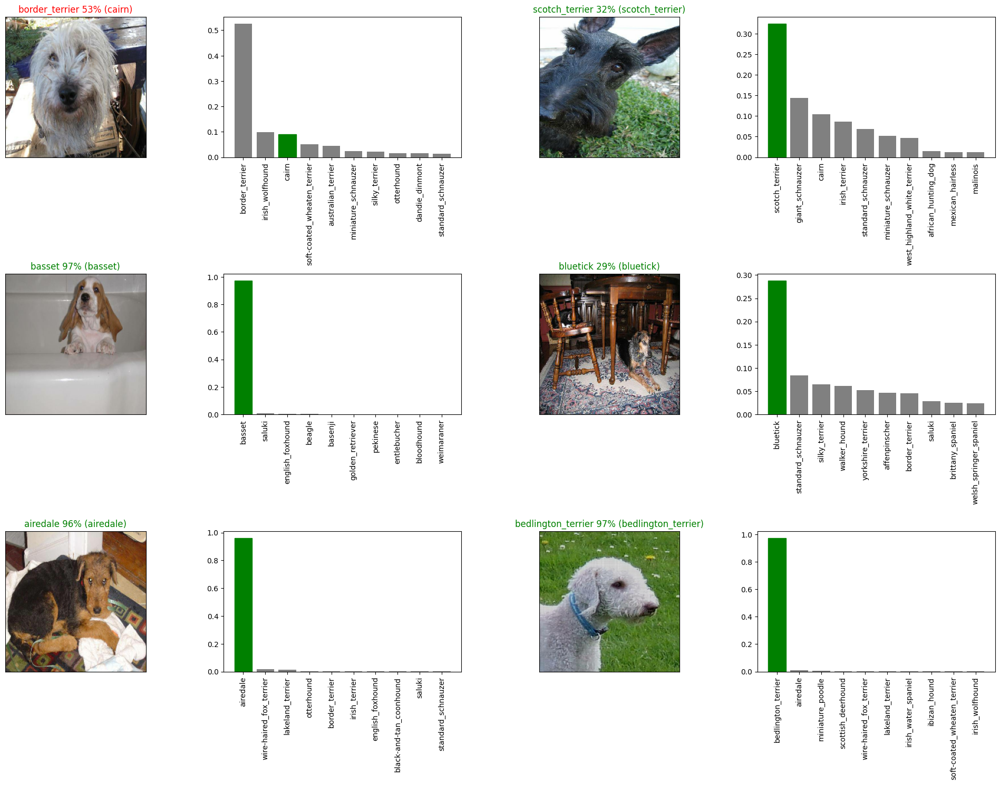

In [117]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a model

For saving a model I will create a function that saves a model as a h5 file to a specified directory

In [118]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and
  appends a suffix (str) for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("/content/drive/MyDrive/Projects/dog-breeder/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

I will also create a function for loading the model

In [119]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [120]:
save_model(model, suffix='1000-images-Adam')

Saving model to: /content/drive/MyDrive/Projects/dog-breeder/models/20230907-16361694104610-1000-images-Adam.h5...


'/content/drive/MyDrive/Projects/dog-breeder/models/20230907-16361694104610-1000-images-Adam.h5'

In [121]:
model_1000_images = load_model('/content/drive/MyDrive/Projects/dog-breeder/models/20230907-13171694092656-1000-images-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Projects/dog-breeder/models/20230907-13171694092656-1000-images-Adam.h5


Comparing original and loaded models by using evaluate() method

In [122]:
model.evaluate(val_data)

7/7 [==============================] - 1s 127ms/step - loss: 1.3225 - accuracy: 0.6500


[1.3224834203720093, 0.6499999761581421]

In [123]:
model_1000_images.evaluate(val_data)

7/7 [==============================] - 2s 140ms/step - loss: 1.3331 - accuracy: 0.6700


[1.3330579996109009, 0.6700000166893005]

## Training a model on the full data

In [124]:
len(X), len(y)

(10222, 10222)

Now I will functions during working on the project to create data batches, build a model, create callbacks

In [125]:
full_data = create_data_batches(X, y)

Creating training data batches


In [126]:
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [127]:
full_model_tensorboard = create_tensorboard_callback()

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

Training the model on the full data

In [129]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

Epoch 1/30
320/320 [==============================] - 45s 129ms/step - loss: 1.3416 - accuracy: 0.6689
Epoch 2/30
320/320 [==============================] - 35s 109ms/step - loss: 0.4018 - accuracy: 0.8808
Epoch 3/30
320/320 [==============================] - 35s 108ms/step - loss: 0.2374 - accuracy: 0.9339
Epoch 4/30
320/320 [==============================] - 34s 106ms/step - loss: 0.1542 - accuracy: 0.9629
Epoch 5/30
320/320 [==============================] - 35s 109ms/step - loss: 0.1052 - accuracy: 0.9784
Epoch 6/30
320/320 [==============================] - 34s 105ms/step - loss: 0.0767 - accuracy: 0.9861
Epoch 7/30
320/320 [==============================] - 35s 110ms/step - loss: 0.0576 - accuracy: 0.9923
Epoch 8/30
320/320 [==============================] - 35s 110ms/step - loss: 0.0462 - accuracy: 0.9945
Epoch 9/30
320/320 [==============================] - 35s 110ms/step - loss: 0.0386 - accuracy: 0.9955
Epoch 10/30
320/320 [==============================] - 35s 108ms/step - l

Saving and reloading the full model

In [130]:
save_model(full_model, suffix="all-images-Adam")

Saving model to: /content/drive/MyDrive/Projects/dog-breeder/models/20230907-16481694105320-all-images-Adam.h5...


'/content/drive/MyDrive/Projects/dog-breeder/models/20230907-16481694105320-all-images-Adam.h5'

In [142]:
loaded_full_model = load_model('/content/drive/MyDrive/Projects/dog-breeder/models/20230907-16481694105320-all-images-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Projects/dog-breeder/models/20230907-16481694105320-all-images-Adam.h5


## Making predictions on the test dataset

In [147]:
test_path = "/content/drive/MyDrive/Projects/dog-breeder/dog-breed-identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:3]

['/content/drive/MyDrive/Projects/dog-breeder/dog-breed-identification/test/e17defebd1b8fc39e9c3c10df3c2e3de.jpg',
 '/content/drive/MyDrive/Projects/dog-breeder/dog-breed-identification/test/df2d806debebfd39e858f877756518e8.jpg',
 '/content/drive/MyDrive/Projects/dog-breeder/dog-breed-identification/test/e330d9cfe81e42338ddbf8a121930e83.jpg']

In [148]:
len(test_filenames)

10357

In [149]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [150]:
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 149s 450ms/step


In [151]:
test_predictions[:10]

array([[9.55629389e-08, 2.64207370e-06, 1.52719561e-08, ...,
        2.45380099e-04, 1.42982273e-04, 1.45175818e-07],
       [1.10810993e-06, 2.70408362e-09, 8.43641268e-10, ...,
        2.29060561e-07, 2.84291173e-06, 4.09664764e-08],
       [3.98123134e-09, 5.73394576e-13, 9.26781360e-11, ...,
        1.16778942e-09, 5.12384753e-11, 7.89912691e-10],
       ...,
       [4.50374472e-07, 1.01054684e-04, 2.91271135e-04, ...,
        4.37492702e-07, 1.42783277e-11, 1.58007524e-07],
       [5.50413788e-05, 1.35627613e-06, 2.77052585e-08, ...,
        7.59390204e-08, 3.70764019e-09, 4.80864557e-08],
       [5.32284048e-06, 8.12505903e-08, 1.56979993e-08, ...,
        8.72027570e-08, 5.18359968e-08, 1.79424209e-08]], dtype=float32)

### Preparing test dataset predictions for Kaggle

Since the dataset is taken from Kaggle competition, it would be good to test prediction for Kaggle. Thye want model's output probabilities each for label along with the image IDs

In [152]:
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [153]:
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e17defebd1b8fc39e9c3c10df3c2e3de,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,df2d806debebfd39e858f877756518e8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e330d9cfe81e42338ddbf8a121930e83,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e443bb594a89ab5fa1266748d6b41648,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e57a2bee790b512b2ba824b26f3f93fd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [154]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e17defebd1b8fc39e9c3c10df3c2e3de,9.556294e-08,2.642074e-06,1.527196e-08,1.888316e-03,2.577029e-09,3.114313e-09,1.931881e-09,4.396612e-09,4.913314e-07,...,2.698476e-06,2.368172e-10,9.441069e-08,9.752557e-06,5.774252e-07,4.310116e-10,1.549341e-08,2.453801e-04,1.429823e-04,1.451758e-07
1,df2d806debebfd39e858f877756518e8,1.108110e-06,2.704084e-09,8.436413e-10,2.699842e-07,9.853275e-10,4.373025e-09,5.960139e-04,7.399940e-08,2.510112e-08,...,2.283631e-08,9.327635e-09,3.878804e-09,1.333154e-08,8.794859e-11,1.556681e-08,3.107543e-08,2.290606e-07,2.842912e-06,4.096648e-08
2,e330d9cfe81e42338ddbf8a121930e83,3.981231e-09,5.733946e-13,9.267814e-11,1.200653e-10,3.427178e-06,9.826410e-09,1.080477e-11,9.493403e-11,5.633873e-13,...,1.453664e-10,9.167855e-09,2.328559e-11,2.797706e-10,1.331920e-11,9.432910e-13,4.588609e-11,1.167789e-09,5.123848e-11,7.899127e-10
3,e443bb594a89ab5fa1266748d6b41648,2.376833e-09,1.790648e-06,1.333903e-09,1.451642e-05,1.523482e-11,2.479694e-08,4.610497e-13,1.798820e-11,1.775583e-10,...,2.943308e-10,3.457459e-13,3.108002e-09,6.529951e-07,2.301568e-07,1.068487e-10,6.649689e-12,8.744516e-07,5.330156e-12,2.125099e-10
4,e57a2bee790b512b2ba824b26f3f93fd,1.974551e-09,4.565485e-10,5.216141e-08,2.347824e-11,3.609944e-13,2.417356e-13,2.496720e-11,2.174589e-12,5.459583e-11,...,8.586848e-12,8.494598e-12,3.692324e-13,1.062634e-11,2.997927e-12,1.304129e-11,4.493860e-08,2.853028e-13,1.809048e-10,6.921981e-11


In [155]:
preds_df.to_csv("/content/drive/MyDrive/Projects/dog-breeder/full_submission_1_mobilienetV2_adam.csv",
                 index=False)

In [156]:
a = input()
print(a)

a
a
